In [1]:
import pandas as pd

def load_and_process_csv(file_path, age_group_column):
    """
    Load a CSV file and transform it into the desired format.

    :param file_path: Path to the CSV file.
    :param age_group_column: The column name for the specific age group or the summed up value.
    :return: Transformed DataFrame.
    """
    # Load the CSV file
    df = pd.read_csv(file_path)

    # Select only the year, cause of death, and the specified age group column
    df_filtered = df[['Jahr', 'Todesursache', age_group_column]]

    # Pivot the table to get years as rows and causes of death as columns
    df_pivoted = df_filtered.pivot(index='Jahr', columns='Todesursache', values=age_group_column)

    return df_pivoted

# Example usage
file_path = 'sterbefaelle_destatis.csv'
age_group_column = 'Insgesamt'  # Replace with your specific age group column name if needed
df_transformed = load_and_process_csv(file_path, age_group_column)

print(df_transformed)

Todesursache  Akuter oder rezidivierender Myokardinfarkt  \
Jahr                                                       
2000                                               73265   
2001                                               71025   
2002                                               69274   
2003                                               69362   
2004                                               67149   
2005                                               66179   
2006                                               64796   
2007                                               62067   
2008                                               60732   
2009                                               60153   
2010                                               59107   
2011                                               55286   
2012                                               55425   
2013                                               54538   
2014                                    

In [2]:
def correct_by_population(df, population_dict):
    """
    Corrects each year's values by population size and converts them to values per 100,000 citizens.

    :param df: DataFrame with years as rows and causes of death as columns.
    :param population_dict: Dictionary with population sizes for relevant years.
    :return: DataFrame with corrected values.
    """
    df_corrected = df.copy()
    for year in df_corrected.index:
        if year in population_dict:
            df_corrected.loc[year] = (df_corrected.loc[year] / population_dict[year]) * 100000
        else:
            print(f"Warning: Population data for year {year} not found. Values for this year were not corrected.")
    return df_corrected

# Population data
population_dict = {
    2000: 82260000,
    2001: 82440000,
    2002: 82537000,
    2003: 82532000,
    2004: 82501000,
    2005: 82438000,
    2006: 82315000,
    2007: 82218000,
    2008: 82002000,
    2009: 81802000,
    2010: 81752000,
    2011: 80328000,
    2012: 80524000,
    2013: 80768000,
    2014: 81198000,
    2015: 82176000,
    2016: 82522000,
    2017: 82792000,
    2018: 83019000,
    2019: 83167000,
    2020: 83155000,
    2021: 83237000,
    2022: 84359000
}
df_transformed = correct_by_population(df_transformed, population_dict)
print(df_transformed)

Todesursache  Akuter oder rezidivierender Myokardinfarkt  \
Jahr                                                       
2000                                           89.065159   
2001                                           86.153566   
2002                                           83.930843   
2003                                           84.042553   
2004                                           81.391741   
2005                                           80.277299   
2006                                           78.717123   
2007                                           75.490768   
2008                                           74.061608   
2009                                           73.534877   
2010                                           72.300372   
2011                                           68.825316   
2012                                           68.830411   
2013                                           67.524267   
2014                                    

In [3]:
import pandas as pd
from sklearn.linear_model import LinearRegression
import numpy as np

# ... [Previous functions] ...

def predict_death_counts(df, train_range, predict_range):
    """
    Fit a linear regression model for each cause of death over the train_range and predict for the predict_range.

    :param df: DataFrame with years as rows and causes of death as columns.
    :param train_range: Tuple (start_year, end_year) for training the model.
    :param predict_range: Tuple (start_year, end_year) for predictions.
    :return: DataFrame with predicted death counts.
    """
    models = {}
    for cause in df.columns:
        # Filter data for the training range
        train_data = df.loc[train_range[0]:train_range[1], cause].dropna()
        
        if len(train_data) > 1:  # Ensure there's enough data to fit a model
            # Prepare the data for linear regression
            X_train = np.array(train_data.index).reshape(-1, 1)
            y_train = train_data.values

            # Fit the linear regression model
            model = LinearRegression()
            model.fit(X_train, y_train)
            models[cause] = model

    # Predict for the given range
    predict_years = np.arange(predict_range[0], predict_range[1] + 1).reshape(-1, 1)
    predictions = {cause: model.predict(predict_years) for cause, model in models.items() if model}

    # Create a DataFrame for the predictions
    df_predictions = pd.DataFrame(predictions, index=predict_years.flatten())
    df_predictions.index.name = 'Year'

    return df_predictions

def predict_mean_death_counts(df, train_range, predict_range):
    """
    Retrieve the mean of the time series in the training data for each year in the predict_range.

    :param df: DataFrame with years as rows and causes of death as columns.
    :param train_range: Tuple (start_year, end_year) for training the model.
    :param predict_range: Tuple (start_year, end_year) for predictions.
    :return: DataFrame with predicted death counts.
    """
    # Calculate the mean for each cause of death over the training range
    mean_values = df.loc[train_range[0]:train_range[1]].mean()

    # Create a DataFrame for the predictions
    predict_years = np.arange(predict_range[0], predict_range[1] + 1)
    df_predictions = pd.DataFrame(index=predict_years, columns=df.columns)
    df_predictions.index.name = 'Year'

    # Fill the predictions DataFrame with the mean values
    for year in predict_years:
        df_predictions.loc[year] = mean_values

    return df_predictions

# Example usage
train_range = (2000, 2014)  # Replace with your actual training year range
predict_range = (2014, 2022)  # Replace with your actual prediction year range
df_predictions = predict_death_counts(df_transformed, train_range, predict_range)
#df_predictions = predict_mean_death_counts(df_transformed, train_range, predict_range)

print(df_predictions['Grippe'])

Year
2014    0.231277
2015    0.233585
2016    0.235894
2017    0.238203
2018    0.240511
2019    0.242820
2020    0.245129
2021    0.247438
2022    0.249746
Name: Grippe, dtype: float64


In [4]:
def norm_by_std(df_std, df_predictions):
    """
    Calculate the yearly delta between actual and predicted values in terms of standard deviations.

    :param df_train: DataFrame with reference values to use as measure for the standard deviation.
    :param df_train: DataFrame with actual values used for training.
    :param df_predictions: DataFrame with predicted values.
    :return: DataFrame with yearly delta expressed in standard deviations.
    """
    # Calculate standard deviations for the training data
    std_devs = df_std.std()

    # Replace zeros in standard deviations with a small number to avoid division by zero
    std_devs_nonzero = std_devs.replace(0, 1e-9)

    # Normalize the deltas by the standard deviations
    yearly_deltas_in_std = df_predictions.div(std_devs_nonzero)

    return yearly_deltas_in_std
    
def calculate_yearly_delta_in_std(df_std, df_train, df_predictions):
    """
    Calculate the yearly delta between actual and predicted values in terms of standard deviations.

    :param df_std: DataFrame with reference values to use as measure for the standard deviation.
    :param df_train: DataFrame with actual values used for training.
    :param df_predictions: DataFrame with predicted values.
    :return: DataFrame with yearly delta expressed in standard deviations.
    """
    # Calculate standard deviations for the training data
    std_devs = df_std.std()

    # Replace zeros in standard deviations with a small number to avoid division by zero
    std_devs_nonzero = std_devs.replace(0, 1e-9)

    # Ensure that the predictions DataFrame is aligned with the training DataFrame
    df_aligned_predictions = df_predictions.reindex(df_train.columns, axis=1)

    # Calculate the yearly delta
    yearly_deltas = df_train - df_aligned_predictions

    # Normalize the deltas by the standard deviations
    yearly_deltas_in_std = yearly_deltas.div(std_devs_nonzero)

    # Handle cases where predicted is zero and actual is non-zero
    zero_predicted = (df_train != 0) & (df_aligned_predictions == 0)
    yearly_deltas_in_std[zero_predicted] = 999

    return yearly_deltas_in_std

# Example usage
df_train = df_transformed.loc[train_range[0]:train_range[1]]
df_actual = df_transformed.loc[predict_range[0]:predict_range[1]]
df_yearly_delta_in_std = calculate_yearly_delta_in_std(df_train, df_actual, df_predictions)
print("Yearly Delta in Standard Deviations:")
#print(df_actual)
print(df_yearly_delta_in_std)

Yearly Delta in Standard Deviations:
Todesursache  Akuter oder rezidivierender Myokardinfarkt  \
Jahr                                                       
2014                                           -0.326917   
2015                                           -0.068033   
2016                                           -0.232844   
2017                                           -0.298922   
2018                                           -0.214158   
2019                                           -0.301248   
2020                                           -0.040825   
2021                                            0.274036   
2022                                            0.619461   

Todesursache  Akzid. Vergiftung: schädl. Substanzen (inkl. Exp.)  \
Jahr                                                               
2014                                                   0.120145    
2015                                                   0.587579    
2016                          

In [5]:
def calculate_yearly_relative_delta(df_actual, df_predictions):
    """
    Calculate the yearly relative delta between actual and predicted values.

    :param df_actual: DataFrame with actual values used for training.
    :param df_predictions: DataFrame with predicted values.
    :return: DataFrame with yearly relative delta expressed as a percentage.
    """
    # Ensure that the predictions DataFrame is aligned with the training DataFrame
    df_aligned_predictions = df_predictions.reindex(df_actual.columns, axis=1)

    # Replace zeros in df_train with a small number to avoid division by zero
    df_predictions_nonzero = df_predictions.replace(0, 1e-9)

    # Calculate the yearly relative delta
    yearly_relative_deltas = (df_actual - df_aligned_predictions) / df_predictions_nonzero * 100

    # Handle cases where predicted is zero and actual is non-zero
    zero_predicted = (df_actual != 0) & (df_aligned_predictions == 0)
    yearly_relative_deltas[zero_predicted] = 100

    return yearly_relative_deltas

# Example usage
df_yearly_relative_delta = calculate_yearly_relative_delta(df_actual, df_predictions)
print("Yearly Relative Delta in Percentages:")
print(df_yearly_relative_delta)

Yearly Relative Delta in Percentages:
Todesursache  Akuter oder rezidivierender Myokardinfarkt  \
Jahr                                                       
2014                                           -3.979376   
2015                                           -0.851065   
2016                                           -2.995805   
2017                                           -3.958767   
2018                                           -2.921902   
2019                                           -4.238192   
2020                                           -0.592832   
2021                                            4.111556   
2022                                            9.613674   

Todesursache  Akzid. Vergiftung: schädl. Substanzen (inkl. Exp.)  \
Jahr                                                               
2014                                                   2.001533    
2015                                                   9.945908    
2016                         

In [6]:
def calculate_year_to_year_deltas(df):
    """
    Calculate year-to-year deltas for each cause of death.

    :param df: DataFrame with years as rows and causes of death as columns.
    :return: DataFrame with year-to-year deltas.
    """
    # Calculate the difference from the previous year for each cause of death
    df_deltas = df.diff()

    return df_deltas

# Example usage
df_yearly_deltas = calculate_year_to_year_deltas(df_transformed)
print(df_yearly_deltas)

Todesursache  Akuter oder rezidivierender Myokardinfarkt  \
Jahr                                                       
2000                                                 NaN   
2001                                           -2.911593   
2002                                           -2.222723   
2003                                            0.111710   
2004                                           -2.650812   
2005                                           -1.114441   
2006                                           -1.560176   
2007                                           -3.226355   
2008                                           -1.429160   
2009                                           -0.526731   
2010                                           -1.234505   
2011                                           -3.475056   
2012                                            0.005095   
2013                                           -1.306144   
2014                                    

In [7]:
def calculate_annual_average(df):
    """
    Calculate the average value for all causes of death for each year.

    :param df: DataFrame with years as rows and causes of death as columns.
    :return: Series with the average value for each year.
    """
    # Calculate the mean across columns for each year
    annual_averages = df.mean(axis=1)

    return annual_averages

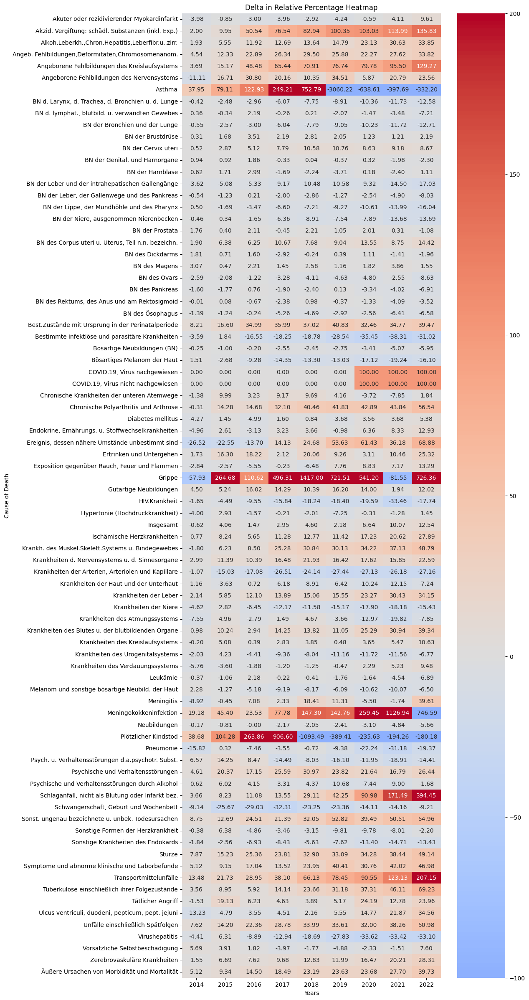

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_heatmap(df, title, vmin=None, vmax=None):
    """
    Create a heatmap visualization.

    :param df: DataFrame
    :param title: The title to show in the graphic.
    :param vmin: Minimum data value that anchors the colormap.
    :param vmax: Maximum data value that anchors the colormap.
    """
    df = df.astype(float)
    plt.figure(figsize=(10, 30))
    #sns.heatmap(df.T, annot=True, cmap='coolwarm', center=0, fmt=".2f")
    sns.heatmap(df.T, annot=True, cmap='coolwarm', center=0, vmin=vmin, vmax=vmax, fmt=".2f")
    plt.title(title)
    plt.xlabel('Years')
    plt.ylabel('Cause of Death')
    plt.show()

plot_heatmap(df_yearly_relative_delta, 'Delta in Relative Percentage Heatmap', -100, 200)

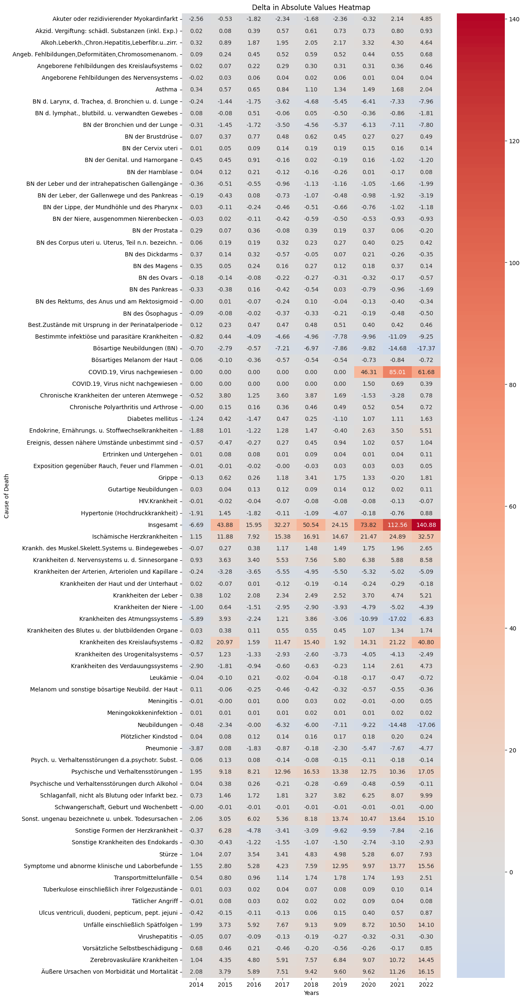

In [9]:
plot_heatmap(df_actual - df_predictions, 'Delta in Absolute Values Heatmap')


Predictions:
Todesursache Akuter oder rezidivierender Myokardinfarkt  \
Year                                                      
2015                                          76.390124   
2016                                          76.390124   
2017                                          76.390124   
2018                                          76.390124   
2019                                          76.390124   
2020                                          76.390124   
2021                                          76.390124   
2022                                          76.390124   

Todesursache Akzid. Vergiftung: schädl. Substanzen (inkl. Exp.)  \
Year                                                              
2015                                                   0.874347   
2016                                                   0.874347   
2017                                                   0.874347   
2018                                                   0.874

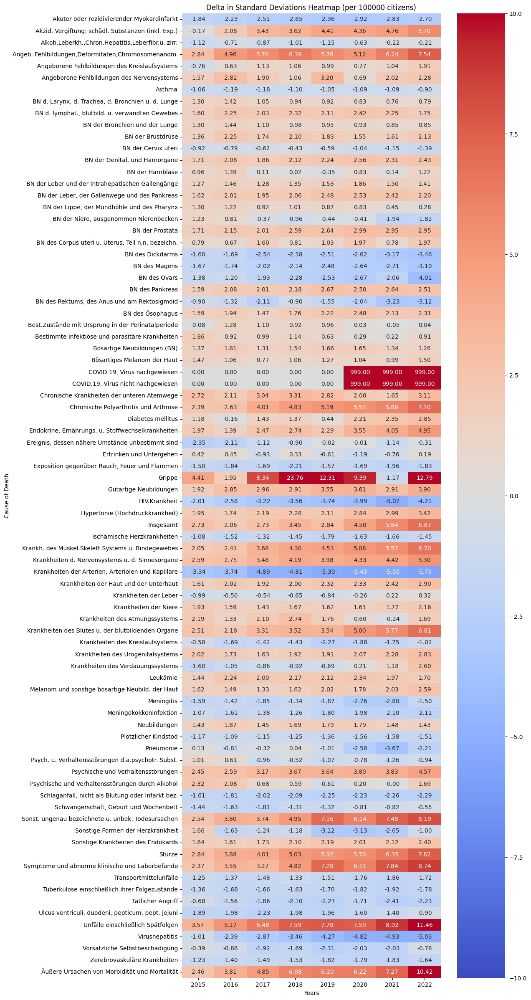

\Delta between predicted and actual values as relative value:
Todesursache Akuter oder rezidivierender Myokardinfarkt  \
Jahr                                                      
2015                                          -18.83946   
2016                                         -22.794994   
2017                                          -25.73948   
2018                                         -27.139347   
2019                                         -30.299005   
2020                                         -29.900106   
2021                                         -28.943763   
2022                                         -27.674436   

Todesursache Akzid. Vergiftung: schädl. Substanzen (inkl. Exp.)  \
Jahr                                                              
2015                                                    -2.5753   
2016                                                  31.249081   
2017                                                  51.404302   
2018        

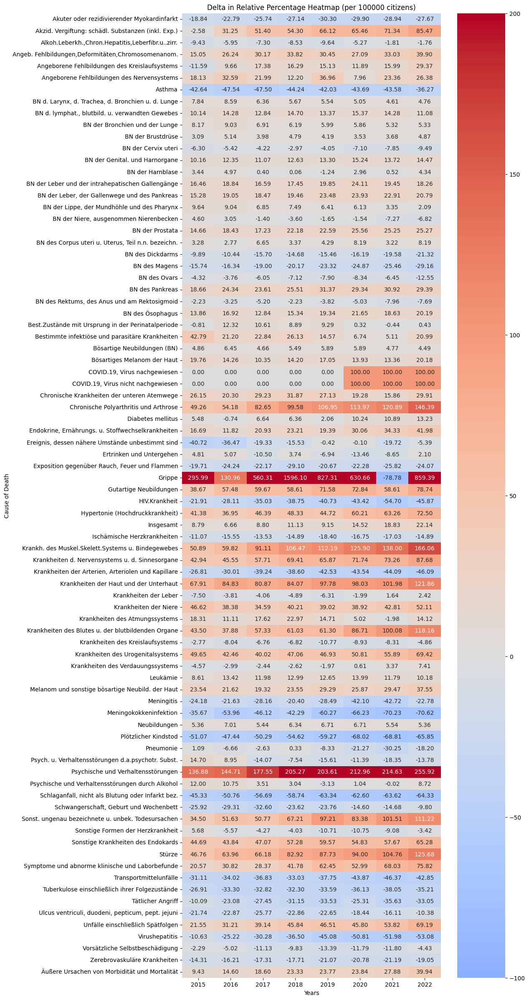

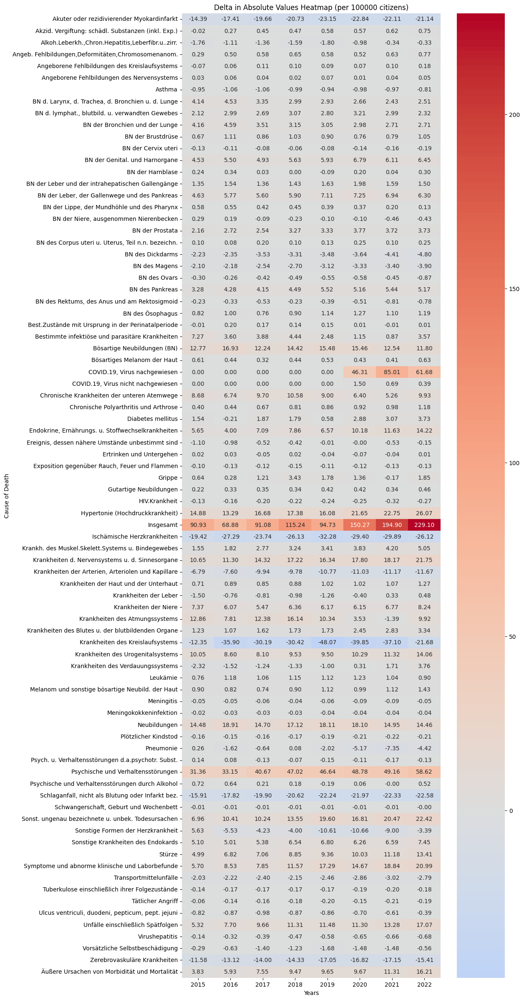

In [10]:
def main(file_path, age_group_column, train_range):
    # Load and transform the data
    df_transformed = load_and_process_csv(file_path, age_group_column)

    # For column Insgesamt we correct by population size
    population_dict = {
        2000: 82260000,
        2001: 82440000,
        2002: 82537000,
        2003: 82532000,
        2004: 82501000,
        2005: 82438000,
        2006: 82315000,
        2007: 82218000,
        2008: 82002000,
        2009: 81802000,
        2010: 81752000,
        2011: 80328000,
        2012: 80524000,
        2013: 80768000,
        2014: 81198000,
        2015: 82176000,
        2016: 82522000,
        2017: 82792000,
        2018: 83019000,
        2019: 83167000,
        2020: 83155000,
        2021: 83237000,
        2022: 84359000
    }
    if age_group_column == "Insgesamt":
        df_transformed = correct_by_population(df_transformed, population_dict)
        title_add = " (per 100000 citizens)"
    else:
        title_add = ""

    # Filter the DataFrame for the training range
    df_train = df_transformed.loc[train_range[0]:train_range[1]]

    # Predict death counts (if needed)
    predict_range = (train_range[1] + 1, 2022)  # Example prediction range
    df_actual = df_transformed.loc[predict_range[0]:predict_range[1]]
    df_predictions = predict_death_counts(df_transformed, train_range, predict_range)
    df_predictions = predict_mean_death_counts(df_transformed, train_range, predict_range)

    # Print debug values
    #print(df_actual.loc[2022]['Grippe'])
    #print(df_predictions.loc[2022]['Grippe'])
    #return

    print("\nPredictions:")
    print(df_predictions)

    # Calculate year to year deltas
    df_year_to_year = calculate_year_to_year_deltas(df_transformed)
    df_year_to_year = df_year_to_year #.loc[predict_range[0]:predict_range[1]]
    #df_year_to_year = df_year_to_year.round(2)
    print("Year to year delta:")
    print(df_year_to_year)
    #plot_heatmap(df_year_to_year.astype(float), 'Year to year delta absolute '+title_add, -5, 5)

    df_y2y_delta_in_std = norm_by_std(df_train, df_year_to_year)
    #plot_heatmap(df_y2y_delta_in_std.astype(float), 'Year to year delta standard deviations'+title_add, -5, 5)

    # Calculate annual average
    annual_averages_df = calculate_annual_average(df_y2y_delta_in_std.drop(columns=['COVID.19, Virus nachgewiesen']).drop(columns=['COVID.19, Virus nicht nachgewiesen']))
    annual_averages_df.columns = ['Average Deaths']
    print("Annual averages of std deviations:")
    print(annual_averages_df)

    # Determine delta in standard deviations
    df_delta_in_std = calculate_yearly_delta_in_std(df_train, df_actual, df_predictions)
    print("\Delta between predicted and actual values in standard deviations:")
    print(df_delta_in_std)

    # Visualize
    plot_heatmap(df_delta_in_std.astype(float), 'Delta in Standard Deviations Heatmap'+title_add, -10, 10)

    df_relative_delta = calculate_yearly_relative_delta(df_actual, df_predictions)
    print("\Delta between predicted and actual values as relative value:")
    print(df_relative_delta)

    # Visualize
    plot_heatmap(df_relative_delta.astype(float), 'Delta in Relative Percentage Heatmap'+title_add, -100, 200)

    # Visualize
    plot_heatmap(df_actual.astype(float) - df_predictions.astype(float), 'Delta in Absolute Values Heatmap'+title_add)

# Example usage
file_path = 'sterbefaelle_destatis.csv'
train_range = (2000, 2014)
age_group_column = 'Insgesamt'  # Replace with your specific age group column name if needed
main(file_path, age_group_column, train_range)

age_group_columns = ['Insgesamt', 'unter 1 Jahr', '1 bis unter 15 Jahre', '15 bis unter 20 Jahre', '20 bis unter 25 Jahre', '25 bis unter 30 Jahre', '30 bis unter 35 Jahre', '35 bis unter 40 Jahre', '40 bis unter 45 Jahre', '45 bis unter 50 Jahre', '50 bis unter 55 Jahre', '55 bis unter 60 Jahre', '60 bis unter 65 Jahre', '65 bis unter 70 Jahre', '70 bis unter 75 Jahre', '75 bis unter 80 Jahre', '80 bis unter 85 Jahre', '85 Jahre und mehr']
#for age_group_column in age_group_columns:
#    main(file_path, age_group_column, train_range)


<img src="image-20231202-031446.png" width="" align="" />

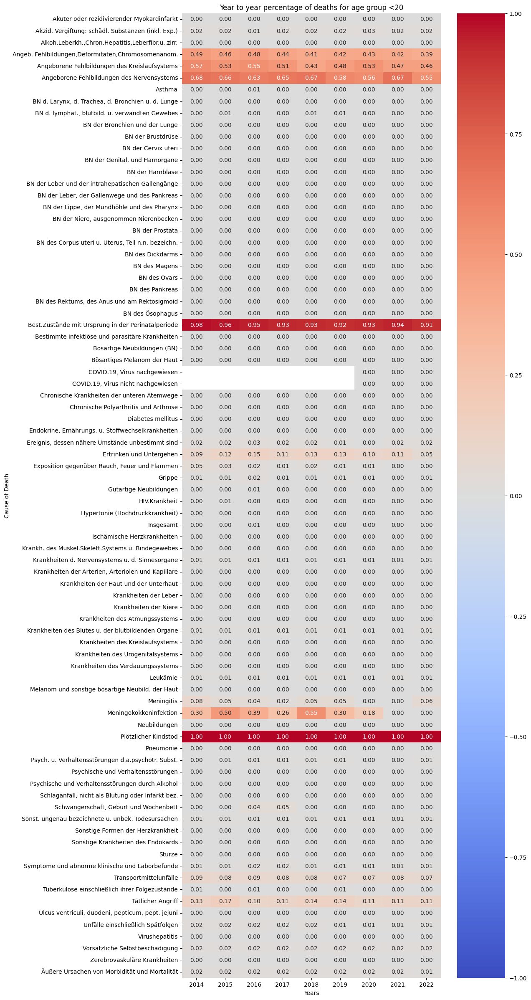

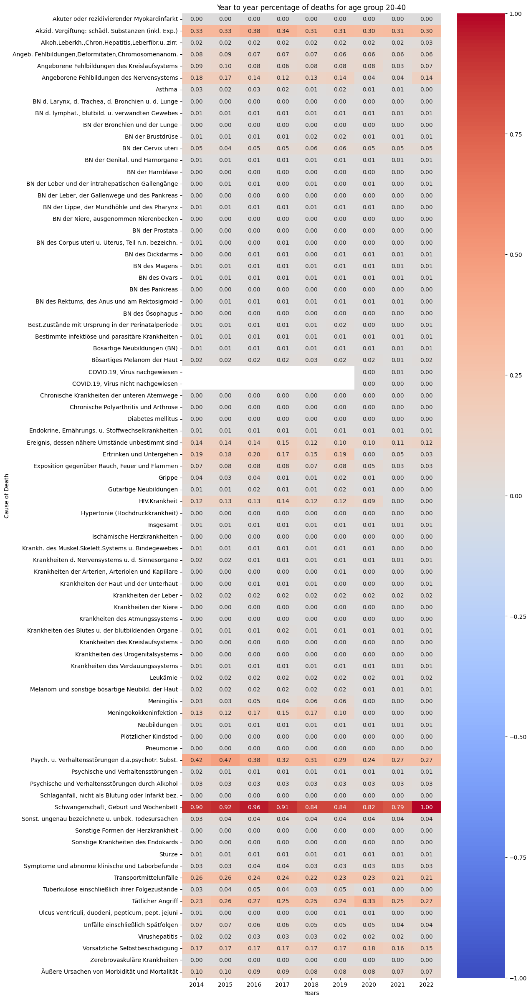

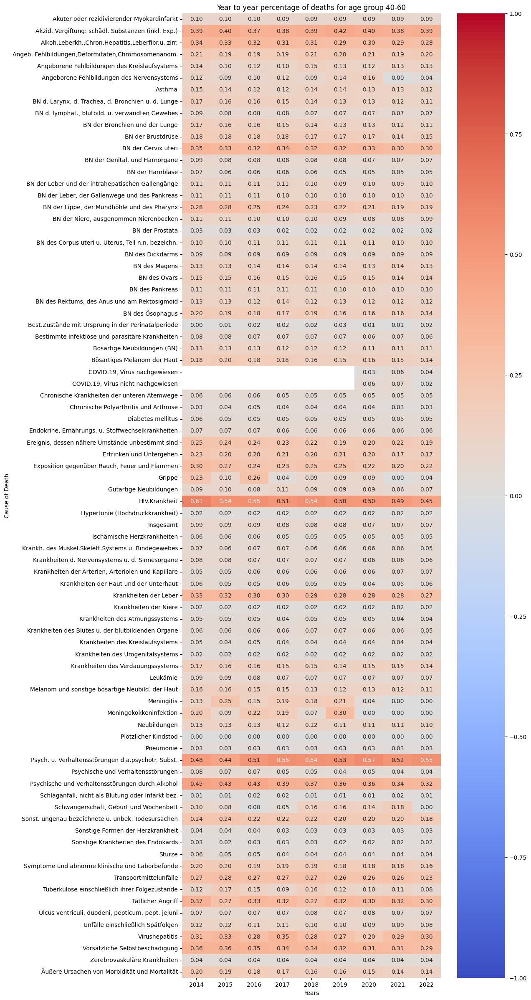

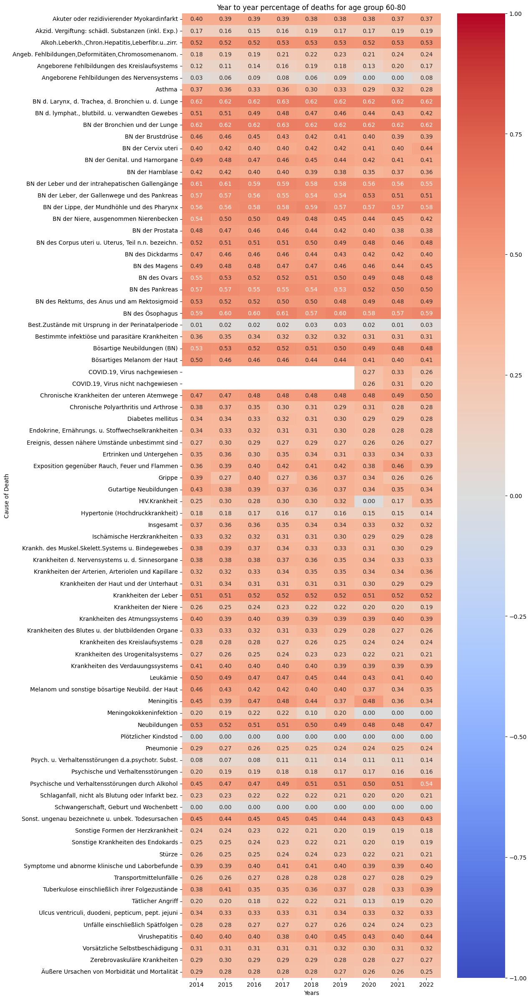

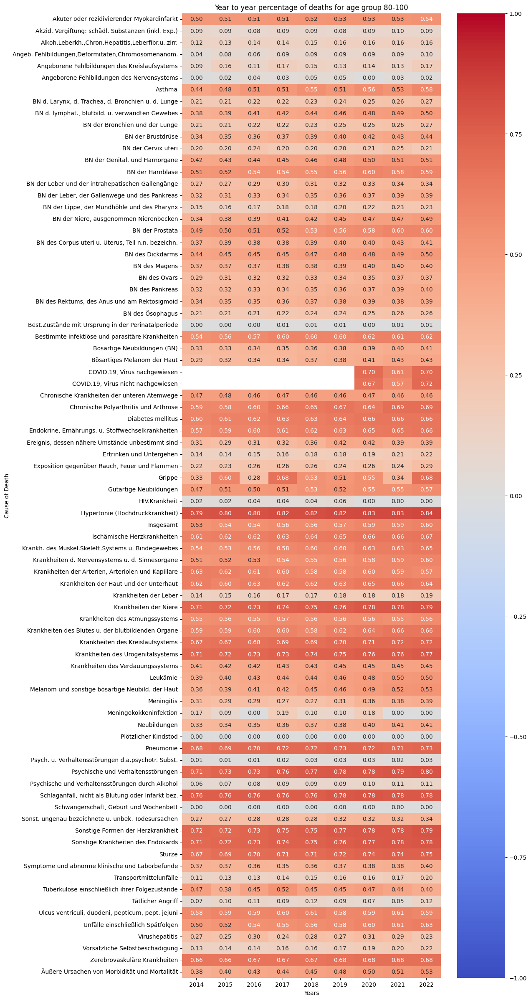

In [11]:
def main_agegroups(cmp_file_path, cmp_column, file_path, age_group_column, train_range):
    # Load and transform the data
    df_transformed = load_and_process_csv(file_path, age_group_column)
    df_cmp = load_and_process_csv(cmp_file_path, cmp_column)
    
    # For column Insgesamt we correct by population size
    population_dict = {
        2000: 82260000,
        2001: 82440000,
        2002: 82537000,
        2003: 82532000,
        2004: 82501000,
        2005: 82438000,
        2006: 82315000,
        2007: 82218000,
        2008: 82002000,
        2009: 81802000,
        2010: 81752000,
        2011: 80328000,
        2012: 80524000,
        2013: 80768000,
        2014: 81198000,
        2015: 82176000,
        2016: 82522000,
        2017: 82792000,
        2018: 83019000,
        2019: 83167000,
        2020: 83155000,
        2021: 83237000,
        2022: 84359000
    }
    if cmp_column == "Insgesamt":
        df_cmp = correct_by_population(df_cmp, population_dict)
    title_add = age_group_column.split('/')[0]

    df_transformed /= df_cmp # Look at difference between totals and the specific age group
    plot_heatmap(df_transformed.loc[predict_range[0]:predict_range[1]].astype(float), 'Year to year percentage of deaths for age group '+title_add, -1, 1)


# Example usage
cmp_file_path = 'sterbefaelle_destatis.csv'
file_path = 'sterbefaelle_destatis_100k_.csv'
train_range = (2000, 2014)

age_group_columns = ['unter 1 Jahr', '1 bis unter 15 Jahre', '15 bis unter 20 Jahre', '20 bis unter 25 Jahre', '25 bis unter 30 Jahre', '30 bis unter 35 Jahre', '35 bis unter 40 Jahre', '40 bis unter 45 Jahre', '45 bis unter 50 Jahre', '50 bis unter 55 Jahre', '55 bis unter 60 Jahre', '60 bis unter 65 Jahre', '65 bis unter 70 Jahre', '70 bis unter 75 Jahre', '75 bis unter 80 Jahre', '80 bis unter 85 Jahre', '85 Jahre und mehr']
age_group_columns = ["<20/100k", "20-40/100k", "40-60/100k", "60-80/100k", "80-100/100k"]
for age_group_column in age_group_columns:
    main_agegroups(cmp_file_path, 'Insgesamt', file_path, age_group_column, train_range)


In [12]:
def find_top_in_dataframe(df, age_group = "Insgesamt", top=True, n=6):
    """
    Find the top/bottom n values in all columns/rows of a DataFrame.

    :param df: DataFrame to analyze.
    :param age_group: The age group value to be added to the results.
    :return: DataFrame with top 6 values, their row names, and column names.
    """
    
    # Convert all columns in df to numeric, coerce errors to NaN
    df_numeric = df.apply(pd.to_numeric, errors='coerce')

    # Find the maximum value in each column
    # Note: Even when looking for the top n bottom values, we use the max() function here, because the value to compare is the *highest* respective delta for each given cause of death
    max_values = df_numeric.max()

    # Convert 'max_values' to a DataFrame
    max_values_df = max_values.reset_index()
    max_values_df.index.name = None
    max_values_df.columns = ['Todesursache', 'Delta%']

    # Find the top 6 values
    if top:
        top = max_values_df.nlargest(n, 'Delta%')
    else:
        top = max_values_df.nsmallest(n, 'Delta%')
    top['Altersgruppe'] = age_group  # Add the age group
    
    return top

def concatenate_and_trim(df1, df2, top=True, n=6, unique_col='Todesursache'):
    """
    Concatenate two DataFrames and trim the result to the top n or bottom n entries.

    :param df1: First DataFrame to concatenate.
    :param df2: Second DataFrame to concatenate.
    :param top: Boolean indicating whether to trim to top n (True) or bottom n (False).
    
    :return: Trimmed DataFrame.
    """
    # Concatenate the DataFrames
    concatenated_df = pd.concat([df1, df2], ignore_index=True)

    # Sort the DataFrame
    if top:
        concatenated_df = concatenated_df.sort_values(by='Delta%', ascending=False)
    else:
        concatenated_df = concatenated_df.sort_values(by='Delta%', ascending=True)

    # Remove duplicates based on the specified column
    concatenated_df = concatenated_df.drop_duplicates(subset=[unique_col])

    # Trim to top or bottom entries
    trimmed_df = concatenated_df.head(n) if top else concatenated_df.tail(n)

    return trimmed_df

print(find_top_in_dataframe(df_yearly_relative_delta))
print(find_top_in_dataframe(df_yearly_relative_delta, "Insgesamt", False))

# Note: This is test data and we are not actualy using the correct source data for the respective age groups, but the same!
print("Concatenate")
t1 = find_top_in_dataframe(df_yearly_relative_delta, "20-40/100k")
t2 = find_top_in_dataframe(df_yearly_relative_delta, "40-60/100k")
print(concatenate_and_trim(t1, t2))

                                         Todesursache       Delta%  \
39                                             Grippe  1417.001573   
59                             Meningokokkeninfektion  1126.944939   
61                               Plötzlicher Kindstod   906.601350   
6                                              Asthma   752.790139   
66  Schlaganfall, nicht als Blutung oder Infarkt bez.   394.447855   
73                             Transportmittelunfälle   207.152489   

   Altersgruppe  
39    Insgesamt  
59    Insgesamt  
61    Insgesamt  
6     Insgesamt  
66    Insgesamt  
73    Insgesamt  
                                         Todesursache    Delta% Altersgruppe
67             Schwangerschaft, Geburt und Wochenbett -9.136977    Insgesamt
14  BN der Leber und der intrahepatischen Gallengänge -3.617623    Insgesamt
70                 Sonstige Krankheiten des Endokards -1.836308    Insgesamt
41                                      HIV.Krankheit -1.653932    Insgesam

In [13]:
def get_agegroup_raw_and_prediction(file_path, age_group_column, train_range, reduce_actual_range=True):
    # Load and transform the data
    df_transformed = load_and_process_csv(file_path, age_group_column)
    
    # For column Insgesamt we correct by population size
    population_dict = {
        2000: 82260000,
        2001: 82440000,
        2002: 82537000,
        2003: 82532000,
        2004: 82501000,
        2005: 82438000,
        2006: 82315000,
        2007: 82218000,
        2008: 82002000,
        2009: 81802000,
        2010: 81752000,
        2011: 80328000,
        2012: 80524000,
        2013: 80768000,
        2014: 81198000,
        2015: 82176000,
        2016: 82522000,
        2017: 82792000,
        2018: 83019000,
        2019: 83167000,
        2020: 83155000,
        2021: 83237000,
        2022: 84359000
    }
    if age_group_column == "Insgesamt":
        df_transformed = correct_by_population(df_transformed, population_dict)

    # Filter the DataFrame for the training range
    df_train = df_transformed.loc[train_range[0]:train_range[1]]

    # Predict death counts (if needed)
    predict_range = (train_range[1] + 1, 2022)  # Example prediction range
    if reduce_actual_range:
        df_actual = df_transformed.loc[predict_range[0]:predict_range[1]]
    else:
        df_actual = df_transformed
    
    df_predictions = predict_death_counts(df_transformed, train_range, predict_range)
    #df_predictions = predict_mean_death_counts(df_transformed, train_range, predict_range)

    # Print debug values
    #print(df_actual.loc[2022]['Grippe'])
    #print(df_predictions.loc[2022]['Grippe'])
    #return

    return (df_actual, df_predictions)


def get_topvalues(file_path, age_group_column, train_range, top=True, n=6):
    df_actual, df_predictions = get_agegroup_raw_and_prediction(file_path, age_group_column, train_range)

    # Calculate year to year relative deltas
    df_relative_delta = calculate_yearly_relative_delta(df_actual, df_predictions)
    #print("Year to year relative delta:")
    #print(df_relative_delta)

    # Find top/bottom values in age group
    if top:
        return find_top_in_dataframe(df_relative_delta, age_group_column)
    else:
        return find_top_in_dataframe(df_relative_delta, age_group_column, False)

# Example usage
file_path = 'sterbefaelle_destatis_100k_.csv'
train_range = (2000, 2014)

age_group_columns = ["<20/100k", "20-40/100k", "40-60/100k", "60-80/100k", "80-100/100k"]
i=0
for age_group_column in age_group_columns:
    top6 = get_topvalues(file_path, age_group_column, train_range, True, 50)
    bottom6 = get_topvalues(file_path, age_group_column, train_range, False, 50)
    if i==0:
        top6_ = top6
        bottom6_ = bottom6
    else:
        top6_ = concatenate_and_trim(top6_, top6, True, 6)
        bottom6_ = concatenate_and_trim(bottom6_, bottom6, False, 6)

    i += 1

print("Top 6:")
print(top6_)
print("Bottom 6:")
print(bottom6_)

Top 6:
                                        Todesursache        Delta%  \
0                  Krankheiten des Verdauungssystems  15641.783874   
6                                             Grippe   9462.397777   
1  Akzid. Vergiftung: schädl. Substanzen (inkl. E...   6846.344152   
2      Exposition gegenüber Rauch, Feuer und Flammen   6434.229967   
3  BN des Corpus uteri u. Uterus, Teil n.n. bezei...   5923.417891   
4                                   BN der Harnblase   5218.112349   

  Altersgruppe  
0   20-40/100k  
6  80-100/100k  
1     <20/100k  
2   20-40/100k  
3     <20/100k  
4     <20/100k  
Bottom 6:
                                         Todesursache     Delta% Altersgruppe
11  BN d. Larynx, d. Trachea, d. Bronchien u. d. L...  -5.101246  80-100/100k
1                                           Pneumonie  -4.423628   60-80/100k
2          Angeborene Fehlbildungen des Nervensystems  -3.468004   20-40/100k
3                                Plötzlicher Kindstod   0.000

In [14]:
# Test code
df_actual, df_predictions = get_agegroup_raw_and_prediction(file_path, "<20/100k", train_range)
print(df_actual['Grippe'])

Jahr
2015    0.008518
2016    0.012118
2017    0.007247
2018    0.026500
2019    0.018036
2020    0.009621
2021    0.000000
2022    0.014225
Name: Grippe, dtype: float64


In [15]:
!pip install pillow


[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: pip install --upgrade pip


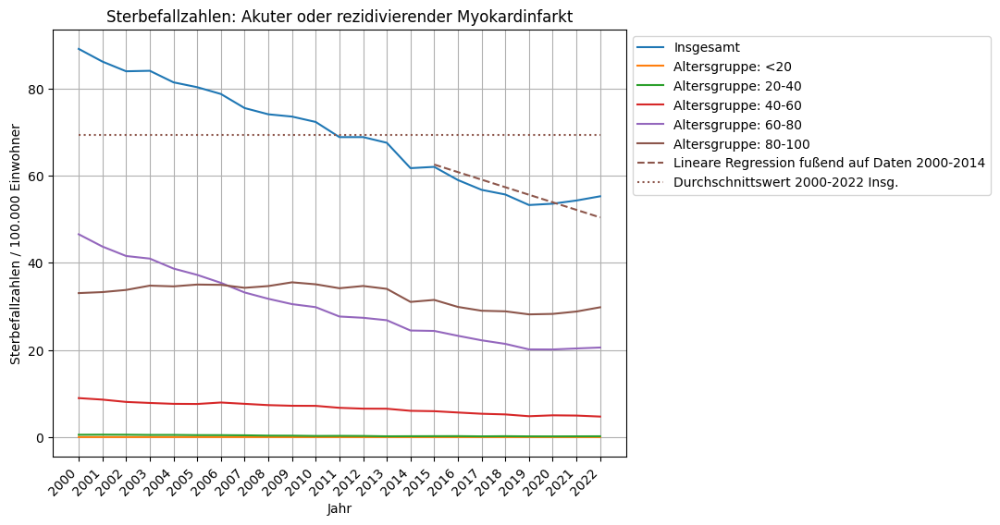

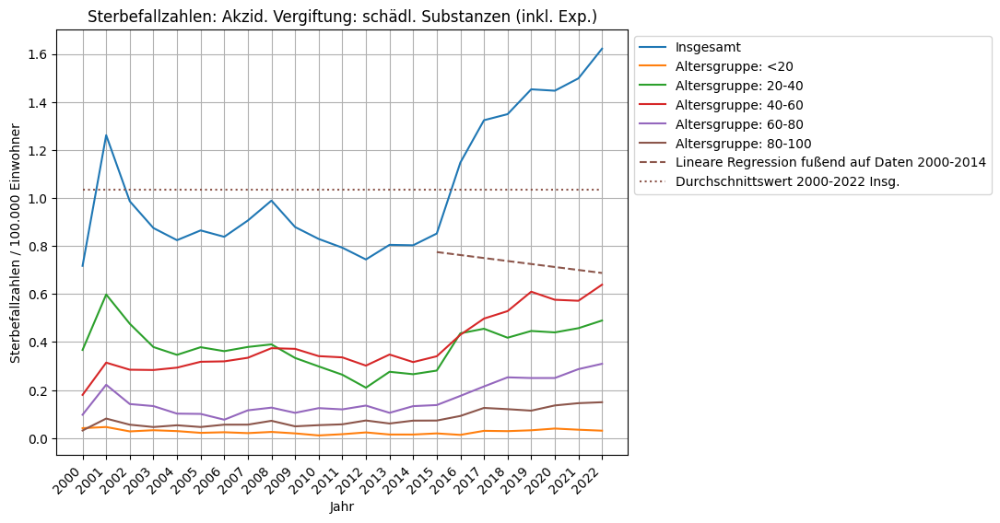

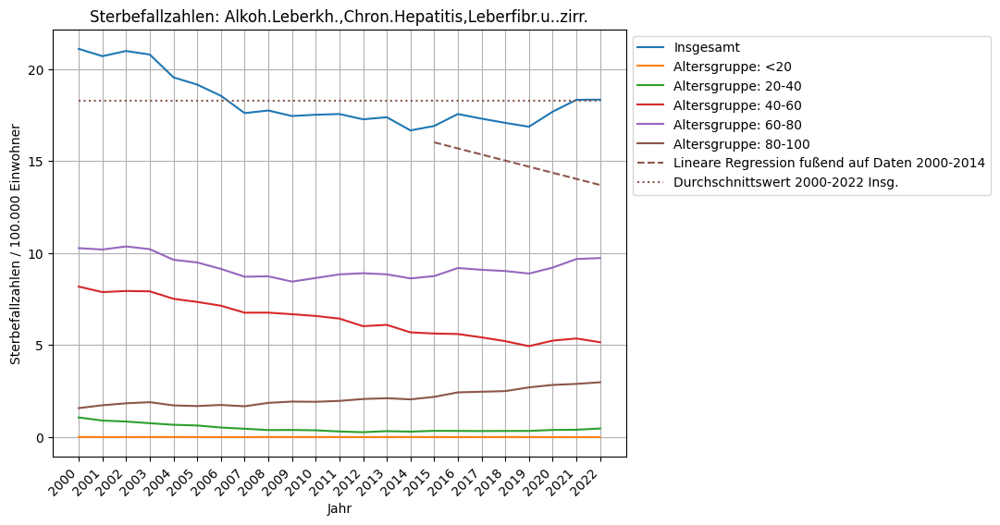

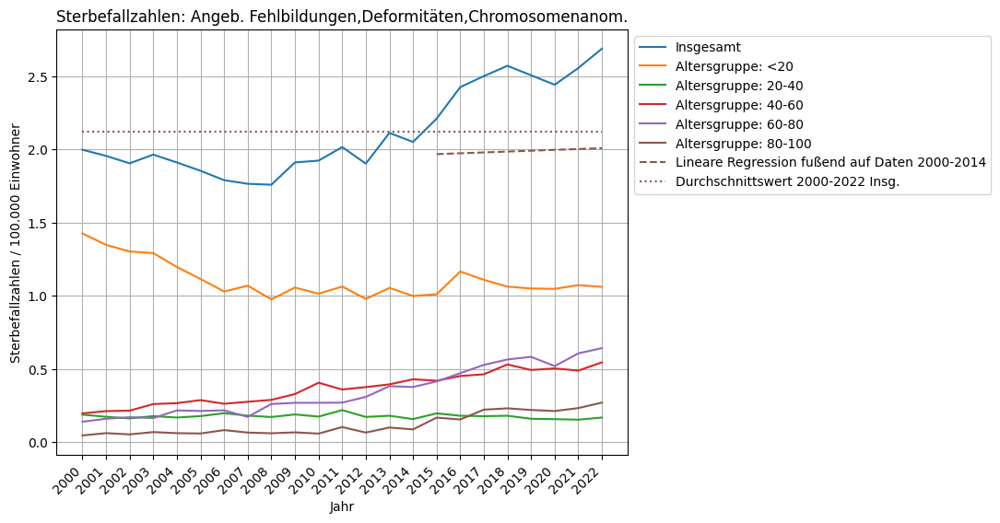

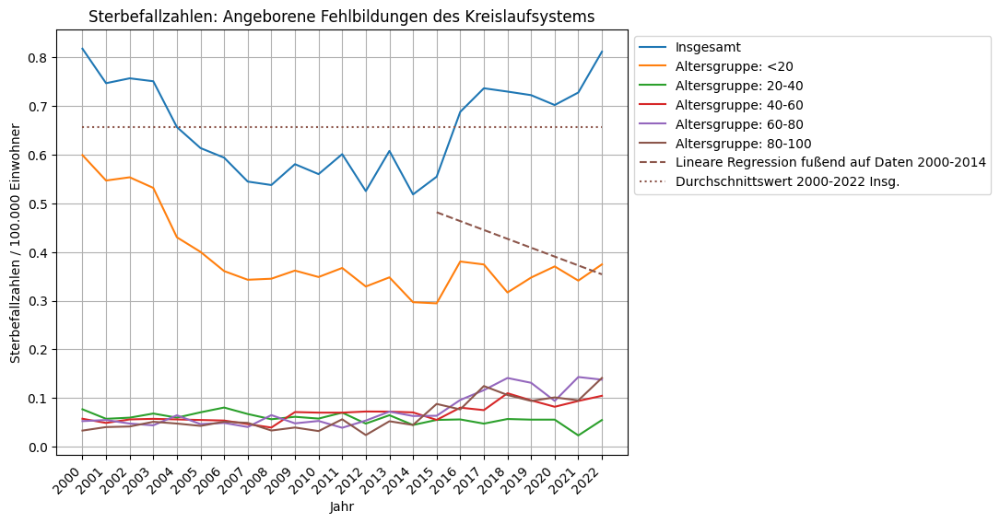

...

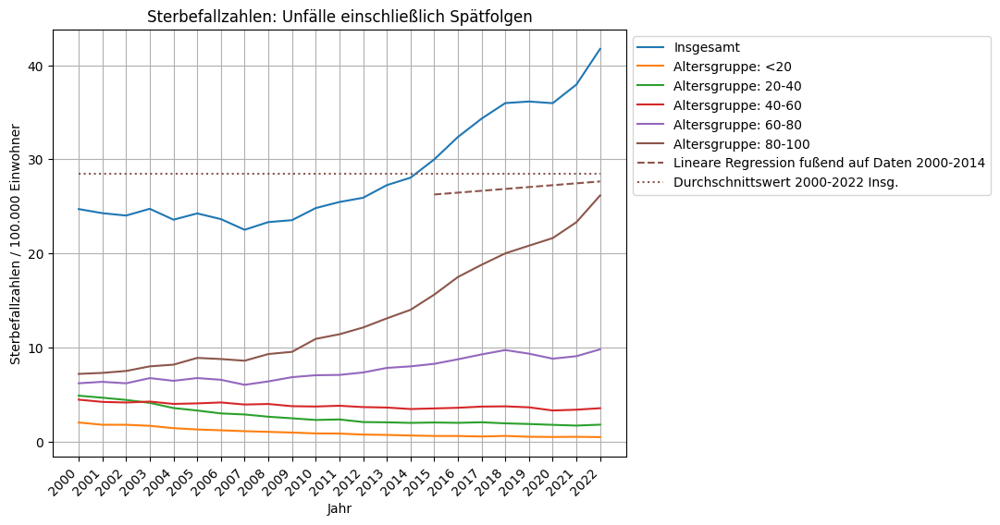

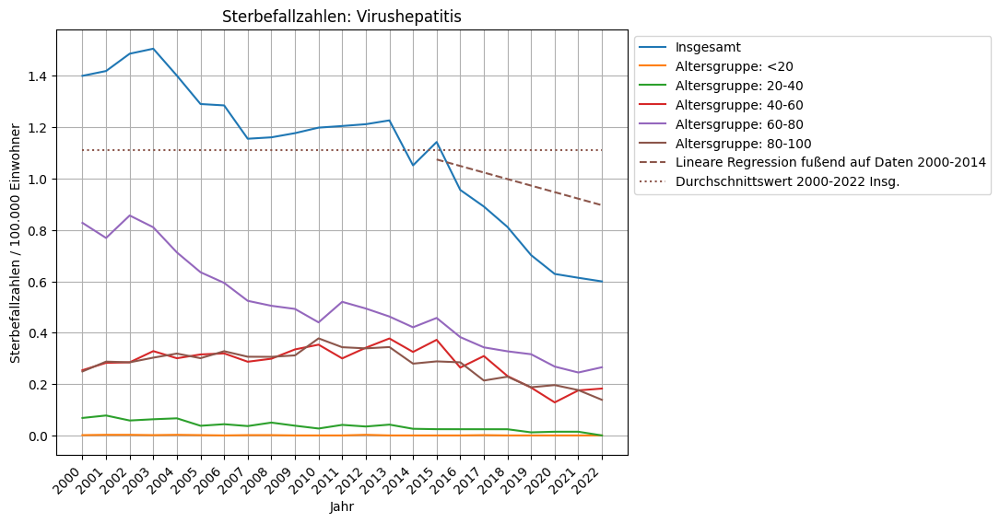

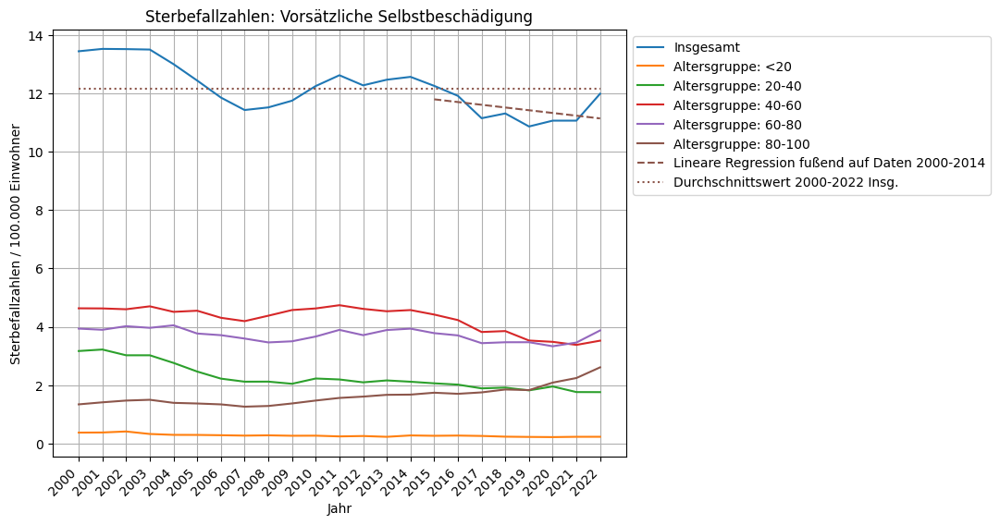

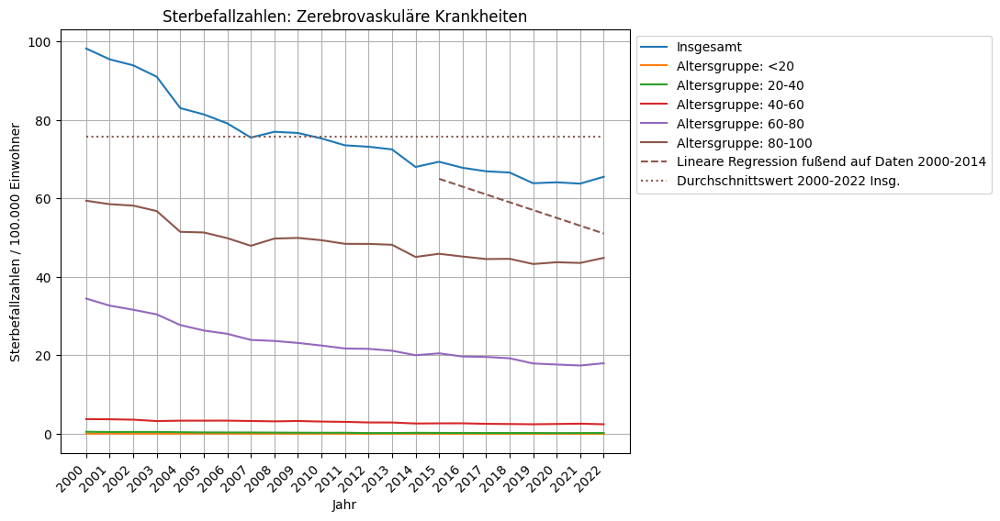

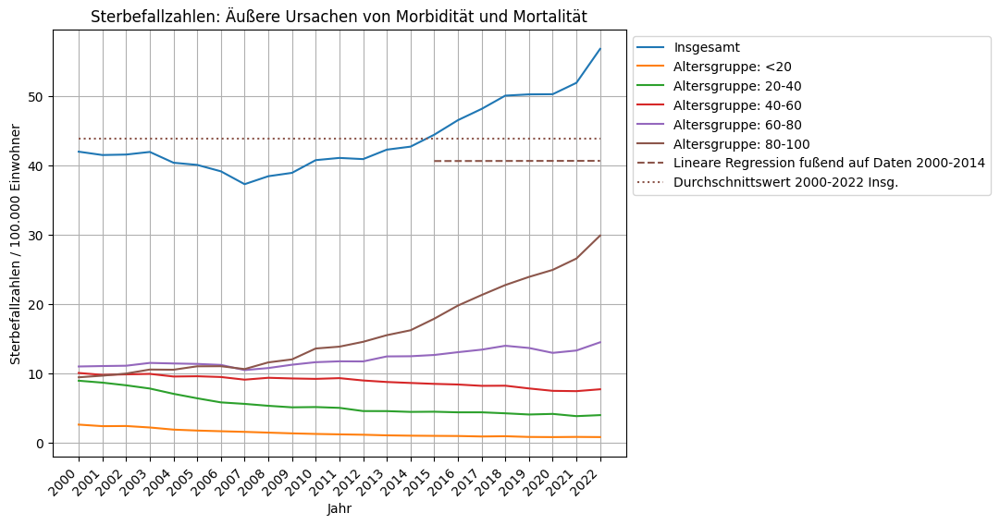

In [16]:
from cycler import cycler
import os
import gc

def line_plot(title, data, df_predicted, base_line):
    # Plotting
    plt.figure(figsize=(8, 6))
    ax = plt.gca()  # Get current axis

    # Define a color cycle, e.g., using the default property cycle
    prop_cycle = plt.rcParams['axes.prop_cycle']
    colors = prop_cycle.by_key()['color']

    i = 0
    for entry in data:
        color = colors[i % len(colors)]  # Cycle through colors
        i += 1
        
        column,df_actual,df_predictions = entry

        # Skip age group if there are no data
        if (df_actual == 0).all().all():
            continue

        if column[-5:] == "/100k":
            column = "Altersgruppe: "+column[0:-5]
        plt.plot(df_actual.index, df_actual, label=f'{column}', linestyle='-', color=color)
    
    # Predicted values
    # TODO: CI 95
    plt.plot(df_predicted.index, df_predicted, label=f'Lineare Regression fußend auf Daten 2000-2014', linestyle='--', color=color)
    
    # Base line
    plt.hlines(y=base_line, xmin=df_actual.index.min(), xmax=df_actual.index.max(), label=f'Durchschnittswert 2000-2022 Insg.', linestyle=':', color=color)

    plt.title('Sterbefallzahlen: '+title)
    plt.xlabel('Jahr')
    plt.ylabel('Sterbefallzahlen / 100.000 Einwohner')

    # Customize x-axis to show each year
    plt.xticks(df_actual.index, df_actual.index, rotation=45, ha='right')
    # Enable grid
    plt.grid(True)

    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    #plt.legend()
    title_ = 'sterbefaelle_'+title.replace(" ","_").replace(".","")+'.png'
    plt.savefig('docs/images/'+title_)
    if os.path.exists("docs/images/"+title_.replace(".png",".jpg")):
        os.remove("docs/images/"+title_.replace(".png",".jpg"))
    plt.show()

    gc.collect()

    return title_

# Example usage
train_range = (2000, 2014)

age_group_columns = ["<20/100k", "20-40/100k", "40-60/100k", "60-80/100k", "80-100/100k"]
cause_of_deaths_of_interest = ["Grippe","Best.Zustände mit Ursprung in der Perinatalperiode","BN der Cervix uteri","Angeborene Fehlbildungen des Nervensystems","Psychische und Verhaltensstörungen","Angeb. Fehlbildungen,Deformitäten,Chromosomenanom.","Plötzlicher Kindstod","Bösartige Neubildungen (BN)","Gutartige Neubildungen","Ischämische Herzkrankheiten","Schlaganfall, nicht als Blutung oder Infarkt bez."]
df_predicted = False

df_actual_cmp, df_predictions_cmp = get_agegroup_raw_and_prediction(cmp_file_path, "Insgesamt", train_range, False)

cause_of_deaths_of_interest = df_transformed.columns

with open('docs/README.md', 'w') as file:
    with open("README.md", 'r', encoding='utf-8') as file2:
        content = file2.read()
    file.write(content)

    for cause_of_death in cause_of_deaths_of_interest:
        data = list()

        # Prepare data for plotting
        data.append(("Insgesamt", df_actual_cmp[cause_of_death], df_predictions_cmp[cause_of_death]))
        base_line = df_actual_cmp[cause_of_death].mean()

        for age_group_column in age_group_columns:
            # could be more performant of done only once
            df_actual, df_predictions = get_agegroup_raw_and_prediction(file_path, age_group_column, train_range, False)
        
            # Prepare data for plotting
            data.append((age_group_column, df_actual[cause_of_death], df_predictions[cause_of_death]))

        filepath = line_plot(cause_of_death, data, df_predictions_cmp[cause_of_death], base_line)
        file.write(f'## Sterbefallzahlen: {cause_of_death}\n')
        file.write(f'![{cause_of_death}](docs/images/{filepath})\n\n')
        #break

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=c0358421-5d5d-4a67-b177-a069e4f7b838' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>